# Filter for diving photos

Inhaltsverzeichnis 

## Motivation

#### We wanted to create a simple but effective filter to combat the loss of colors in underwater pictures that were taken without a artificial light source. First we clarify the theory behind why there is a color loss in underwater pictures relative to the depth and conditions and then we explain our code which provides a rudimentary filter for uploaded pictures.

## Theroy

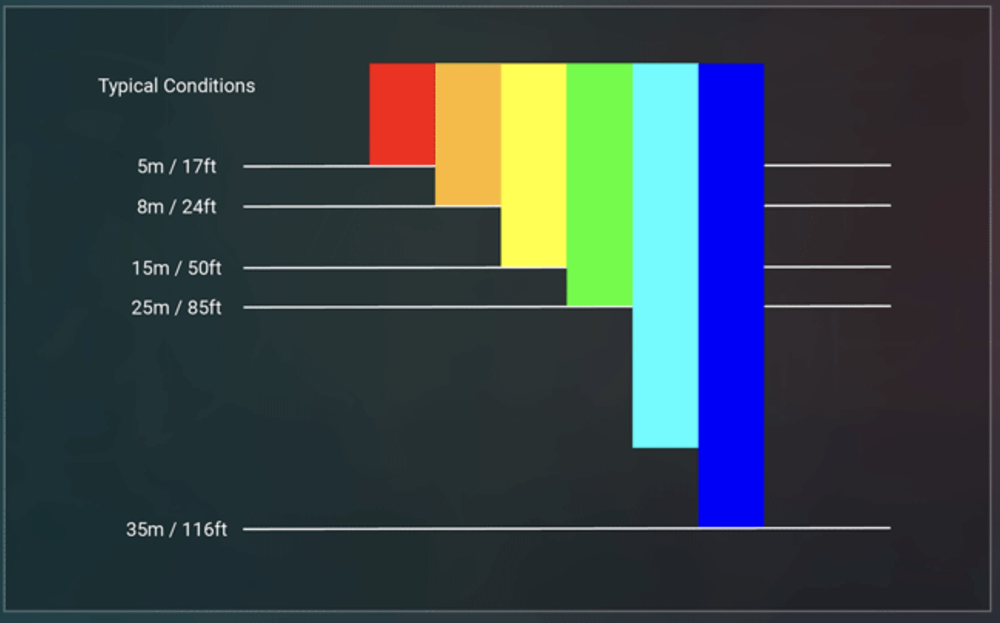
*Figure 1: Color Absorption underwater*

**Source:** https://splitthediff.com/underwater-look/

#### As we can see by *Figure 1* the color red is the first to disappear due to its characteristics of having relatively long wavelengths. After red, the colors orange, yellow and then green follow shortly and get absorbed by the particles and molecules in the water. Blue is the last color which gets absorbed at around 35m due to its short wavelength, which also explains why a lot of stuff underwater seems to be blueish without a light source. **Source:** https://splitthediff.com/underwater-look/

## Filter-Coding

#### At first we import the liberary

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv


## Excursion creating frames

#### Via the Create_Frames.ipynb we are able to create pictures from Ruben's diving videos from Egypt 2024. Those frames are saved and we selected a few good ones and paste those into our "Pictures" folder. We then select and rotate the pictures by 90° counterclockwise. (We don't know why they are tilted but it is an easy fix). 

In [8]:
#Define the path to the folder containing the images
folder = '/Users/rubenschmid/Desktop/ZHAW/4.Semester/Image und Signal Processing/Image-and-Signal-Processing Ruben/Diving_Filter/Pictures'

# Load the selected frames
picture_1 = cv.imread(folder + '/Video_1_0180.jpg')
# picture_2 = cv.imread(folder + '/frame_1.jpg')
# picture_3 = cv.imread(folder + '/frame_2.jpg')

#Rotate the images
picture_1 = cv.rotate(picture_1, cv.ROTATE_90_COUNTERCLOCKWISE)




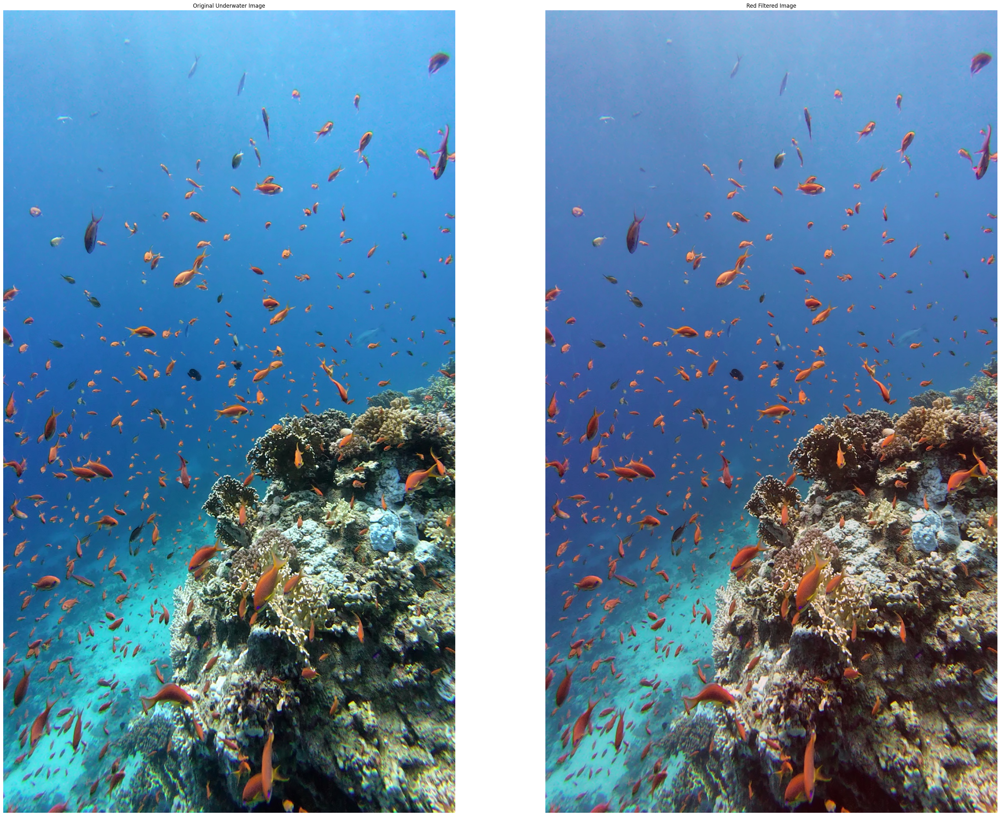

In [19]:

# Load underwater image
img_rgb = cv.cvtColor(picture_1, cv.COLOR_BGR2RGB)

# Convert to float for better manipulation
img_float = img_rgb.astype(np.float32) / 255.0

# Create a RED filter mask (pure red overlay)
red_mask = np.zeros_like(img_float)
red_mask[:,:,0] = 1.0  # Red channel full

# Define how much red to add (strength)
red_strength = 0.10  # 0.0 (no effect) -> 1.0 (full red overlay)

# Blend original image with red mask
filtered_img = img_float * (1 - red_strength) + red_mask * red_strength

# Clip values just in case
filtered_img = np.clip(filtered_img, 0, 1)

# Convert back to uint8 for display
filtered_img_uint8 = (filtered_img * 255).astype(np.uint8)



# Plot the results
plt.figure(figsize=(40,40))
plt.subplot(1,2,1)
plt.title('Original Underwater Image')
plt.imshow(img_rgb)
plt.axis('off')

plt.subplot(1,2,2)
plt.title('Red Filtered Image')
plt.imshow(filtered_img_uint8)
plt.axis('off')




plt.show()